In [2]:
from math import radians, cos, sin, asin, sqrt
import time
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import seaborn as sns 
import pickle
import numpy as np
import pandas as pd
import geopandas as gpd
import folium


import warnings
warnings.filterwarnings('ignore')


graph_filepath = "../data/iowa.graphml"
G = ox.load_graphml(graph_filepath)

states_shp_filepath = "../data/ne_110m_admin_1_states_provinces/ne_110m_admin_1_states_provinces.shp"
states_map = gpd.read_file(states_shp_filepath)
iowa_map = states_map[states_map.name == 'Iowa']

towns_cleaned_filepath = "../data/towns_cleaned.pkl"
with open(towns_cleaned_filepath, "rb") as f:
    towns = pickle.load(f)


populated_towns = towns[towns.population > 3000]
populated_towns['node'] = ox.nearest_nodes(G, populated_towns.centroid.x, populated_towns.centroid.y)

past_routes = pd.read_csv('../data/past_routes.csv', index_col=0)

# Drop the first route since it only was 6 days
past_routes = past_routes[past_routes.route_id != 0].copy()

route_columns = ['Start', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'End']

In [3]:
day_colors = {
    'Start': sns.palettes.color_palette('Set2')[0],
    'Sunday': sns.palettes.color_palette('Set2')[1],
    'Monday': sns.palettes.color_palette('Set2')[2],
    'Tuesday': sns.palettes.color_palette('Set2')[3],
    'Wednesday': sns.palettes.color_palette('Set2')[4],
    'Thursday': sns.palettes.color_palette('Set2')[5],
    'Friday': sns.palettes.color_palette('Set2')[6],
    'End': sns.palettes.color_palette('Set2')[7]
}

In [4]:
# Function to find nearest node in the graph to a given point
def get_nearest_node(point):
    return ox.nearest_nodes(G, point[0], point[1])

def get_city_node(city):
    return get_nearest_node((towns[towns.name == city].centroid.x, towns[towns.name == city].centroid.y))[0]

# Function to compute distance between nodes (towns)
def compute_distance(G, node1, node2, weight='custom_weight'):
    # Weight can also be 'length'
    meters = nx.shortest_path_length(G, node1, node2, weight=weight)
    miles = meters * 0.000621371
    return miles

def get_index_point(i):
    lon = towns.iloc[i].centroid.x
    lat = towns.iloc[i].centroid.y 
    return (lon, lat)

def get_city_latlon(city):
    return towns[towns.name == city].centroid.y.item(), towns[towns.name == city].centroid.x.item()


def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great-circle distance between two points on the Earth.
    
    Parameters:
    - lon1, lat1: Longitude and latitude of the first point in decimal degrees.
    - lon2, lat2: Longitude and latitude of the second point in decimal degrees.
    
    Returns:
    - Distance in miles.
    """
    # Convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat / 2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0)**2
    c = 2 * np.arcsin(np.sqrt(a)) 
    r = 3956 # Radius of Earth in miles
    return c * r


def add_custom_weights(G):
    ''' Calculates a custom weight from the length to bias road selection.'''
    
    road_weights = {
        'primary': 20,
        'trunk': 15,
        'motorway': 12,
        'primary_link': 10,
        'trunk_link': 10,
        'motorway_link': 10
    }
    for u, v, data in G.edges(data=True):
        highway_type = data.get("highway", None)

        if isinstance(highway_type, list):
            # Use the first type in the list
            highway_type = highway_type[0]

        weight = road_weights.get(highway_type, 1)  # Default weight is 1 if not found
        data["custom_weight"] = data["length"] * weight
        # print(highway_type, data["length"], weight)

add_custom_weights(G)

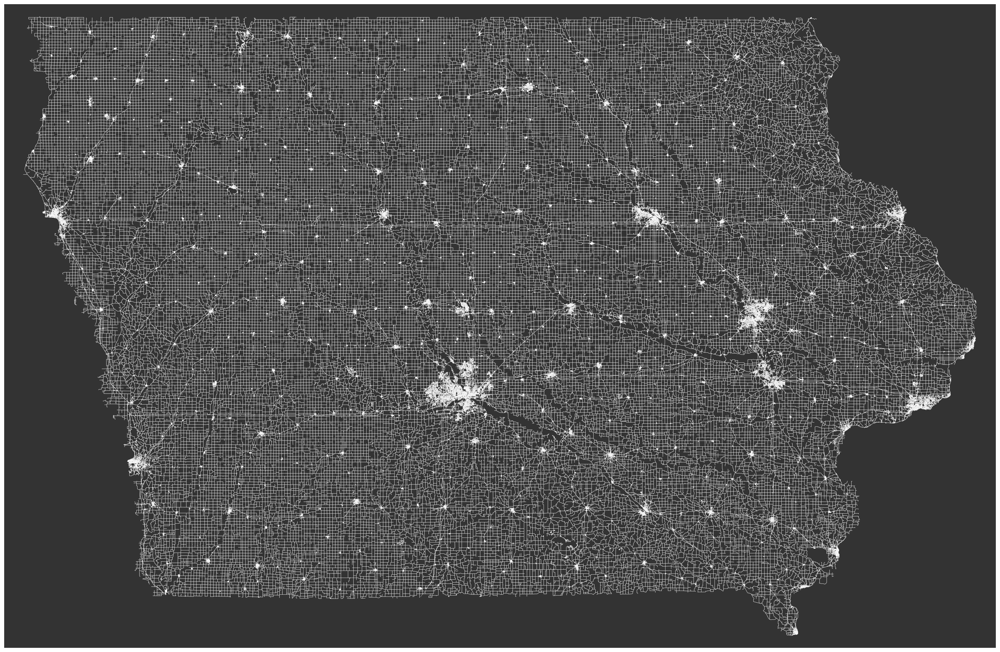

In [5]:
fig, ax = ox.plot_graph(
    G,
    figsize=(34, 20),
    # show=False,
    # close=False,
    bgcolor="#333333",
    edge_color="w",
    edge_linewidth=0.3,
    node_size=0,
)

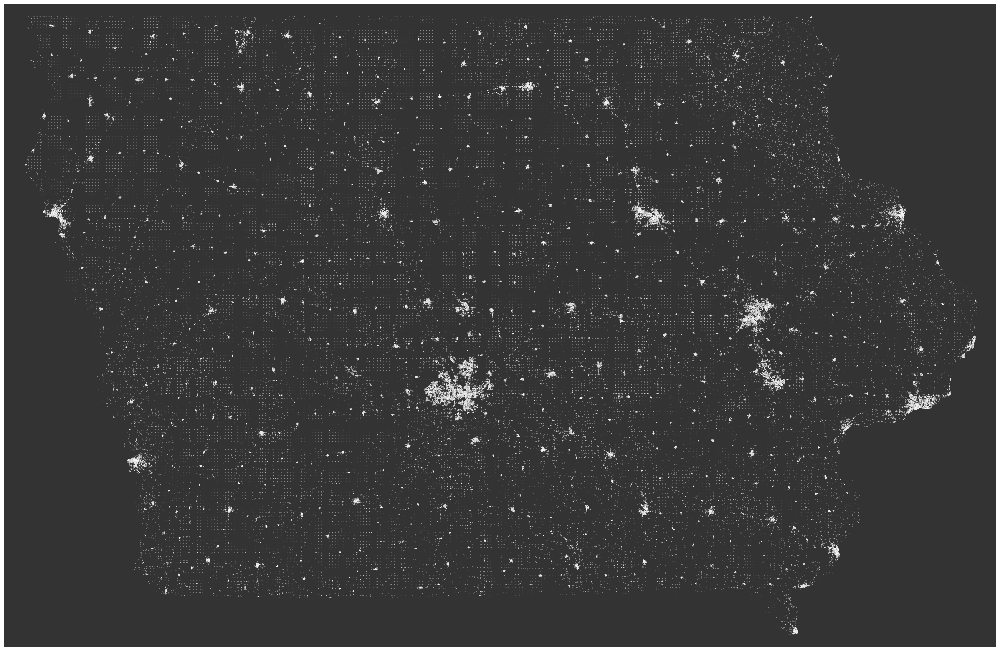

In [6]:
fig, ax = ox.plot_graph(
    G,
    figsize=(34, 20),
    bgcolor="#333333",
    edge_color="w",
    edge_linewidth=0,
    node_size=0.3,
)

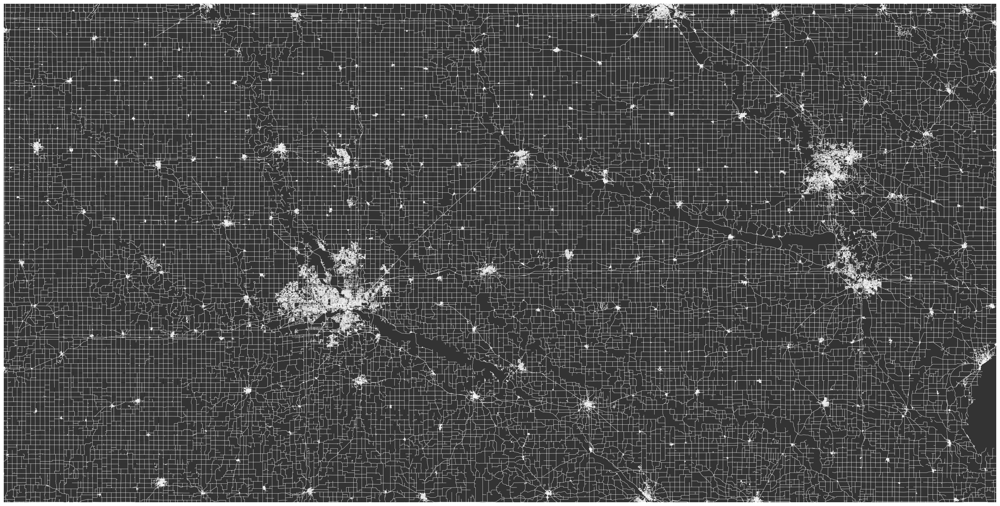

In [7]:
fig, ax = ox.plot_graph(
    G,
    figsize=(34, 20),
    bgcolor="#333333",
    edge_color="w",
    edge_linewidth=0.3,
    node_size=0.3,
    bbox = (42.5, 41, -91, -95)
)

In [8]:
ackworth = get_index_point(0)
ackworth_node = get_nearest_node(ackworth)
adel = get_index_point(1)
adel_node = get_nearest_node(adel)

path = nx.shortest_path(G, source=ackworth_node, target=adel_node, weight='length')

# Extracting the coordinates of the nodes in the path
path_nodes = [(G.nodes[node]['y'], G.nodes[node]['x']) for node in path]

# Create a map centered at the midpoint of the two points
midpoint = ((ackworth[1] + adel[1]) / 2, (ackworth[0] + adel[0]) / 2)
m = folium.Map(location=midpoint, zoom_start=10)

# Add the start and end points
folium.Marker(location=ackworth, popup="Ackworth", icon=folium.Icon(color="green")).add_to(m)
folium.Marker(location=adel, popup="Adel", icon=folium.Icon(color="green")).add_to(m)
folium.Marker(location=(G.nodes[ackworth_node]['y'], G.nodes[ackworth_node]['x']), popup="Closest Start Node").add_to(m)
folium.Marker(location=(G.nodes[adel_node]['y'], G.nodes[adel_node]['x']), popup="Closest End Node").add_to(m)

# Add the path to the map
folium.PolyLine(locations=path_nodes, color='blue', weight=5, opacity=0.7).add_to(m)

# Display the map
m

In [9]:
# Create a map centered at the midpoint of the two points
# midpoint = ((ackworth[0] + adel[0]) / 2, (ackworth[1] + adel[1]) / 2)
m = folium.Map(location=midpoint, zoom_start=10)

# Default length path
path = nx.shortest_path(G, source=ackworth_node, target=adel_node, weight='length')
path_nodes = [(G.nodes[node]['y'], G.nodes[node]['x']) for node in path]
folium.PolyLine(locations=path_nodes, color='blue', weight=5, opacity=0.7).add_to(m)

# Custom weight
path = nx.shortest_path(G, source=ackworth_node, target=adel_node, weight='custom_weight')

path_nodes = [(G.nodes[node]['y'], G.nodes[node]['x']) for node in path]
folium.PolyLine(locations=path_nodes, color='green', weight=5, opacity=0.7).add_to(m)

# Add the start and end points
folium.Marker(location=(G.nodes[ackworth_node]['y'], G.nodes[ackworth_node]['x']), popup="Closest Start Node").add_to(m)
folium.Marker(location=(G.nodes[adel_node]['y'], G.nodes[adel_node]['x']), popup="Closest End Node").add_to(m)

# Display the map
m

Now, lets find possible routes from Sioux Center -> Dubuque

- Start = Sioux Center
- Sunday
- Monday
- Tuesday
- Wednesday
- Thursday
- Friday
- End = Dubuque

MIN_LON_BY_DAY = {1: -95.843896, 2: -95.352768, 3: -95.013834, 4: -94.099904, 5: -92.871726, 6: -91.966689}
MAX_LON_BY_DAY = {1: -94.997726, 2: -94.018832, 3: -93.101352, 4: -91.913251, 5: -91.275853, 6: -90.544873}


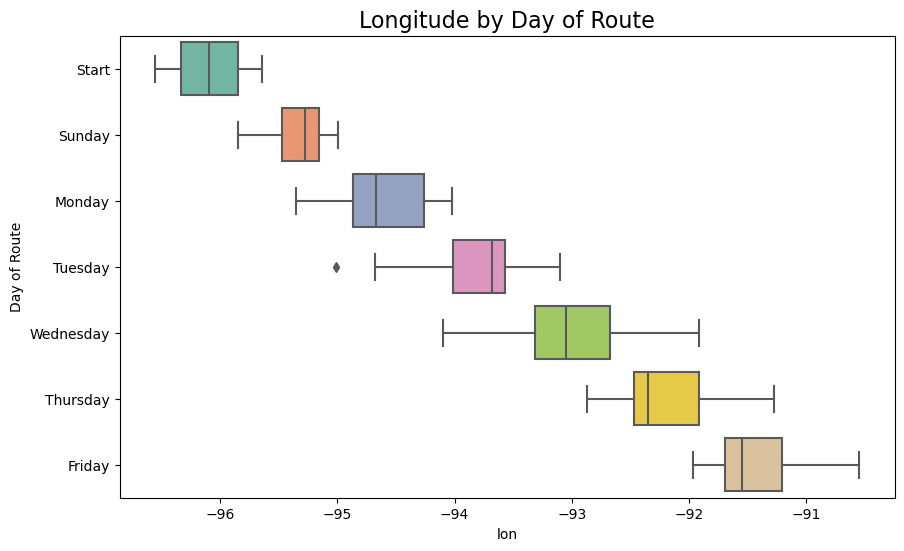

,route_id,lat,lon,day_order,next_lon,next_lat,distance_miles,lat_diff,lon_diff
count,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000
mean,25.543103,42.085231,-93.789350,2.991379,-93.044472,42.029341,45.792023,-0.055891,0.744878
std,14.481863,0.771991,1.588584,2.005018,1.562114,0.785636,11.196812,0.328254,0.304921
min,1.000000,40.671138,-96.557000,0.000000,-95.843896,40.409673,14.223116,-0.961810,-0.278599
25%,13.000000,41.395706,-95.197235,1.000000,-94.379266,41.395706,38.368069,-0.286299,0.543379
50%,26.000000,42.053024,-93.769378,3.000000,-93.045029,42.029948,46.257601,-0.059815,0.768807
75%,38.000000,42.723444,-92.444896,5.000000,-91.596596,42.643014,53.731131,0.152789,0.963622
max,50.000000,43.444082,-90.544873,6.000000,-90.176698,43.444082,74.633615,0.747243,1.480437


In [176]:
route_data = past_routes[route_columns]

# Reshape from wide to long form for easier merging
long_routes = route_data.melt(id_vars=[], value_vars=route_columns,
                              var_name='Day', value_name='Town')
long_routes['Town'] = long_routes['Town'].str.strip()

merged = long_routes.merge(towns[['name', 'lat', 'lon']], 
                           left_on='Town', right_on='name', how='left')

# Now we have a long DataFrame with columns: ['Day', 'Town', 'geometry', 'lon', 'lat']
# We need to preserve the route order. Let's assign a numeric order for each day:
day_order = {day: i for i, day in enumerate(route_columns)}
merged['day_order'] = merged['Day'].map(day_order)


# Add route_id to long data to know which points belong to the same route
# One simple way: we know that each row in past_routes melts into 8 rows (for 8 route columns).
# So if past_routes has N rows, long_routes has 8*N rows.
# We can replicate the route_id by repeating it or by adding it after merging.

# Let's re-do the melt step with an identifier:
past_routes_long = past_routes[route_columns + ['route_id']].melt(id_vars='route_id', value_name='Town', var_name='Day')
past_routes_long['Town'] = past_routes_long['Town'].str.strip()

merged = past_routes_long.merge(towns[['name', 'lat', 'lon']], left_on='Town', right_on='name', how='left')
merged['day_order'] = merged['Day'].map(day_order)

# For each route_id, we want to sort by day_order and compute differences between consecutive days
merged = merged.sort_values(['route_id', 'day_order'])

# Compute differences between consecutive stops within each route
merged['next_lon'] = merged.groupby('route_id')['lon'].shift(-1)
merged['next_lat'] = merged.groupby('route_id')['lat'].shift(-1)

# Calculate haversine distance between consecutive towns
merged['distance_miles'] = haversine(merged['lon'], merged['lat'], 
                                     merged['next_lon'], merged['next_lat'])

# Also compute lat/lon differences between consecutive days
merged['lat_diff'] = merged['next_lat'] - merged['lat']
merged['lon_diff'] = merged['next_lon'] - merged['lon']
segment_data = merged.dropna()


# Create MIN/MAX Longitude dictionaries
min_max_lon_by_day = segment_data.groupby('day_order')['lon'].agg(['min', 'max'])

# Convert the results to dictionaries
MIN_LON_BY_DAY = {day: round(value, 6) for day, value in min_max_lon_by_day['min'].items()}
MAX_LON_BY_DAY = {day: round(value, 6) for day, value in min_max_lon_by_day['max'].items()}
del MIN_LON_BY_DAY[0]
del MAX_LON_BY_DAY[0]
print("MIN_LON_BY_DAY =", MIN_LON_BY_DAY)
print("MAX_LON_BY_DAY =", MAX_LON_BY_DAY)

plt.figure(figsize=(10, 6))
sns.boxplot(
    data=segment_data,
    x="lon",
    y="Day",
    palette=day_colors
)
plt.title('Longitude by Day of Route', fontsize=16)
plt.ylabel('Day of Route')
plt.show()

segment_data.describe()

In [180]:
# segment_data[['lon_diff']].agg(['min', 'max'])
segment_data[['lon_diff']].agg(['min', 'max'])

,lon_diff
min,-0.278599
max,1.480437


In [193]:
segment_data

,route_id,Day,Town,name,lat,lon,day_order,next_lon,next_lat,distance_miles,lat_diff,lon_diff
0,1,Start,Council Bluffs,Council Bluffs,41.236861,-95.851575,0,-95.013834,41.395706,44.806571,0.158845,0.837741
50,1,Sunday,Atlantic,Atlantic,41.395706,-95.013834,1,-94.499030,41.677921,32.978467,0.282215,0.514804
100,1,Monday,Guthrie Center,Guthrie Center,41.677921,-94.499030,2,-93.723400,41.690984,40.004810,0.013063,0.775630
150,1,Tuesday,Johnston,Johnston,41.690984,-93.723400,3,-92.906722,42.034276,48.221689,0.343291,0.816679
200,1,Wednesday,Marshalltown,Marshalltown,42.034276,-92.906722,4,-92.352215,42.491917,42.440986,0.457642,0.554507
...,...,...,...,...,...,...,...,...,...,...,...,...
149,50,Monday,Atlantic,Atlantic,41.395706,-95.013834,2,-94.018832,41.338224,51.711173,-0.057482,0.995002
199,50,Tuesday,Winterset,Winterset,41.338224,-94.018832,3,-93.102727,41.318921,47.517129,-0.019303,0.916105
249,50,Wednesday,Knoxville,Knoxville,41.318921,-93.102727,4,-92.418637,41.019416,41.131818,-0.299505,0.684090
299,50,Thursday,Ottumwa,Ottumwa,41.019416,-92.418637,5,-91.545212,40.962173,45.690792,-0.057244,0.873425


Thresholds (lat_diff): (-0.945, 0.811)
Thresholds (lon_diff): (-0.087, 1.594)


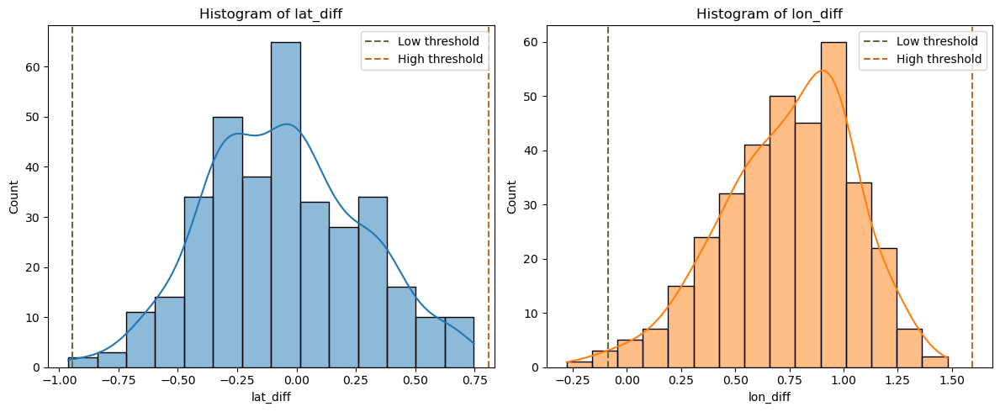

In [217]:
# Calculate Q1, Q3, and IQR for lat_diff
q1_lat = np.percentile(segment_data['lat_diff'], 25)
q3_lat = np.percentile(segment_data['lat_diff'], 75)
iqr_lat = q3_lat - q1_lat
LOW_LAT_DIFF = q1_lat - 1.5*iqr_lat
HIGH_LAT_DIFF = q3_lat + 1.5*iqr_lat

print(f"Thresholds (lat_diff): ({LOW_LAT_DIFF:.3f}, {HIGH_LAT_DIFF:.3f})")

# Calculate Q1, Q3, and IQR for lon_diff
q1_lon = np.percentile(segment_data['lon_diff'], 25)
q3_lon = np.percentile(segment_data['lon_diff'], 75)
iqr_lon = q3_lon - q1_lon
LOW_LON_DIFF = q1_lon - 1.5*iqr_lon
HIGH_LON_DIFF = q3_lon + 1.5*iqr_lon

print(f"Thresholds (lon_diff): ({LOW_LON_DIFF:.3f}, {HIGH_LON_DIFF:.3f})")

# Create subplots (1 row, 2 columns)
color_low = '#606c38'
color_high = '#bc6c25'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# --- Plot for lat_diff ---
sns.histplot(data=segment_data, x='lat_diff', ax=axes[0], kde=True, color='tab:blue')
axes[0].axvline(LOW_LAT_DIFF, color=color_low, linestyle='--', label='Low threshold')
axes[0].axvline(HIGH_LAT_DIFF, color=color_high, linestyle='--', label='High threshold')
axes[0].set_title('Histogram of Latitude Traveled')
axes[0].legend()

# --- Plot for lon_diff ---
sns.histplot(data=segment_data, x='lon_diff', ax=axes[1], kde=True, color='tab:orange')
axes[1].axvline(LOW_LON_DIFF, color=color_low, linestyle='--', label='Low threshold')
axes[1].axvline(HIGH_LON_DIFF, color=color_high, linestyle='--', label='High threshold')
axes[1].set_title('Histogram of Longitude Traveled')
axes[1].legend()

plt.tight_layout()
plt.show()

In [192]:
MIN_LON_DIFF = segment_data[['lon_diff']].min().item()
MAX_LON_DIFF = segment_data[['lon_diff']].max().item()
MIN_LAT_DIFF = segment_data[['lat_diff']].min().item()
MAX_LAT_DIFF = segment_data[['lat_diff']].max().item()

print(f"Lon difference: {MIN_LON_DIFF:.3f}, {MAX_LON_DIFF:.3f}")
print(f"Lat difference: {MIN_LAT_DIFF:.3f}, {MAX_LAT_DIFF:.3f}")

Lon difference: -0.279, 1.480
Lat difference: -0.962, 0.747


In [149]:
# Calculate min and max based on historic quantiles
quantiles = [0.05, 0.95]
quantiles_lon_by_day = segment_data.groupby('day_order')['lon'].quantile(quantiles).unstack()

# Convert the results to dictionaries
LOW_LON_BY_DAY = {day: round(value, 6) for day, value in quantiles_lon_by_day[quantiles[0]].items()}
HIGH_LON_BY_DAY = {day: round(value, 6) for day, value in quantiles_lon_by_day[quantiles[1]].items()}
del LOW_LON_BY_DAY[0]
del HIGH_LON_BY_DAY[0]
print("LOW_LON_BY_DAY =", LOW_LON_BY_DAY)
print("HIGH_LON_BY_DAY =", HIGH_LON_BY_DAY)

LOW_LON_BY_DAY = {1: -95.769477, 2: -95.126965, 3: -94.423304, 4: -93.744551, 5: -92.754048, 6: -91.963858}
HIGH_LON_BY_DAY = {1: -95.013834, 2: -94.133772, 3: -93.204989, 4: -92.392789, 5: -91.595503, 6: -90.66496}


In [158]:
LOW_LON_BY_DAY = MIN_LON_BY_DAY
HIGH_LON_BY_DAY = MAX_LON_BY_DAY

In [157]:
segment_data.groupby('day_order')['lon'].quantile([0, 1]).unstack()

,0.0,1.0
day_order,,
0,-96.557000,-95.644317
1,-95.843896,-94.997726
2,-95.352768,-94.018832
3,-95.013834,-93.101352
4,-94.099904,-91.913251
5,-92.871726,-91.275853
6,-91.966689,-90.544873


<Axes: xlabel='distance_miles', ylabel='Count'>

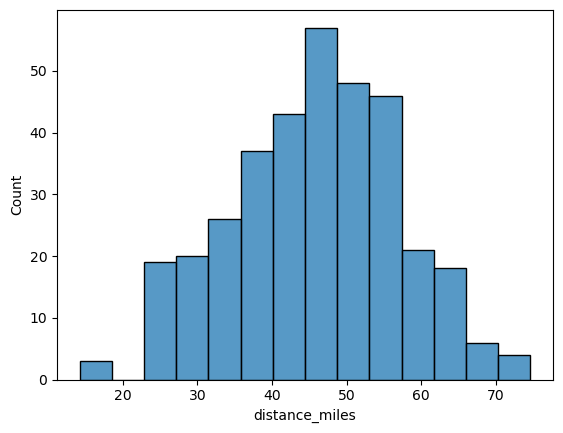

In [13]:
sns.histplot(segment_data.distance_miles)

In [14]:
# segment_data.sort_values(by='lon_diff')

In [15]:
# segment_data.sort_values(by='lat_diff')

In [16]:
segment_data[segment_data.day_order == 3].sort_values(by=['day_order', 'lon']).head(3)

,route_id,Day,Town,name,lat,lon,day_order,next_lon,next_lat,distance_miles,lat_diff,lon_diff
177,28,Tuesday,Atlantic,Atlantic,41.395706,-95.013834,3,-94.099904,41.841994,56.345823,0.446288,0.913931
197,48,Tuesday,Emmetsburg,Emmetsburg,43.114296,-94.680084,3,-93.199647,43.148773,74.633615,0.034477,1.480437
157,8,Tuesday,Greenfield,Greenfield,41.305827,-94.459334,3,-93.754523,40.740751,53.573412,-0.565075,0.704811


In [17]:
segment_data[segment_data.day_order == 2].sort_values(by=['day_order', 'lon']).head(3)

,route_id,Day,Town,name,lat,lon,day_order,next_lon,next_lat,distance_miles,lat_diff,lon_diff
127,28,Monday,Denison,Denison,42.016160,-95.352768,2,-95.013834,41.395706,46.264877,-0.620454,0.338934
102,3,Monday,Harlan,Harlan,41.649624,-95.326876,2,-94.379266,42.016579,54.940208,0.366956,0.947610
113,14,Monday,Storm Lake,Storm Lake,42.643014,-95.197235,2,-94.175167,42.509856,52.771905,-0.133158,1.022068


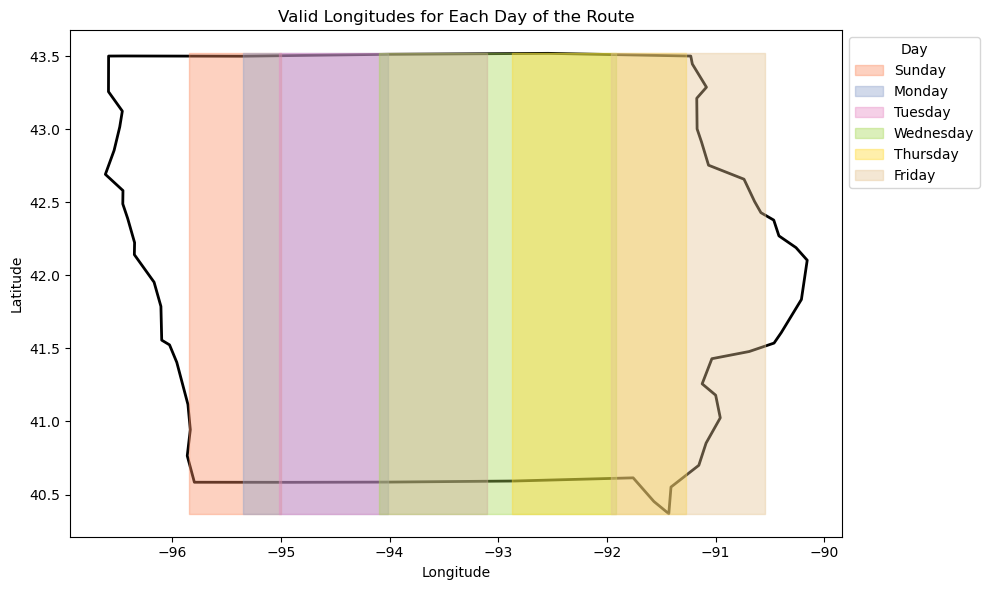

In [159]:
# Build a list of towns that are 35-75 miles apart
MIN_DAILY_DIST = 35
MAX_DAILY_DIST = 75

fig, ax = plt.subplots(figsize=(12, 6))
iowa_map.plot(ax=ax, color='none', edgecolor='black', linewidth=2)
iowa_bounds = iowa_map.total_bounds  # [minx, miny, maxx, maxy]
min_y, max_y = iowa_bounds[1], iowa_bounds[3]

# Plot shaded regions for each day
for day in LOW_LON_BY_DAY:
    low_lon = LOW_LON_BY_DAY[day]
    high_lon = HIGH_LON_BY_DAY[day]
    ax.fill_betweenx(
        y=[min_y, max_y],
        x1=low_lon,
        x2=high_lon,
        color=sns.color_palette('Set2')[day],
        alpha=0.4,
        label=f"{route_columns[day]}" if day not in ax.get_legend_handles_labels()[1] else ""  # Avoid duplicate labels
    )

ax.set_title("Valid Longitudes for Each Day of the Route")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend(title="Day", loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

In [274]:
def get_candidate_nodes(current_city, current_day_index, constraint_sets={}):
    """
    Given the current node and coordinates, return a dataframe of candidate towns
    that are in the correct general geographic location (rough filter) and 
    within the allowed straight-line distance range (15 to 85 miles), 
    and to the east of current_lon.
    """
    # Get current city coordinates
    current_lat, current_lon = get_city_latlon(current_city)
    
    min_lon = LOW_LON_BY_DAY[current_day_index] if current_day_index in LOW_LON_BY_DAY else -99
    max_lon = HIGH_LON_BY_DAY[current_day_index] if current_day_index in HIGH_LON_BY_DAY else 0

    # Only consider towns with reasonable lat/lon differences
    filtered = populated_towns[
        (populated_towns['lat'] > (current_lat + LOW_LAT_DIFF)) &
        (populated_towns['lat'] < (current_lat + HIGH_LAT_DIFF)) &
        (populated_towns['lon'] > (current_lon + LOW_LON_DIFF)) &
        (populated_towns['lon'] < (current_lon + HIGH_LON_DIFF)) &
        (populated_towns['lon'] >= min_lon) & 
        (populated_towns['lon'] <= max_lon) &
        (populated_towns['name'] != current_city)
    ].copy()

    # Rough filtering by distance, not considering roads
    filtered['distance_miles'] = haversine(
        current_lon, current_lat,
        filtered['lon'].values, filtered['lat'].values
    )
    filtered = filtered[
        (filtered['distance_miles'] >= 15) &
        (filtered['distance_miles'] <= 85)
    ].copy()

    next_day_index = current_day_index + 1
    next_day_constraints = constraint_sets.get(next_day_index, None)
    if next_day_constraints:
        filtered = filtered[filtered['name'].isin(next_day_constraints)]

    return filtered.node, filtered.name

In [258]:
constraint_sets={}
next_day_index = 1 + 1
next_day_constraints = constraint_sets.get(next_day_index, None)
if next_day_constraints:
    print(1)
    # filtered = filtered[filtered['name'].isin(next_day_constraints)]

In [ ]:
# Back up these routes and merge 
# onawa_routes = df_k.copy()
# sioux_center_routes = df_k.copy()
# missouri_valley_routes = df_k.copy()


# merged_routes = pd.concat([onawa_routes, sioux_center_routes, missouri_valley_routes])

In [ ]:
# Back up these routes and merge 
# onawa_routes = df_k.copy()
# sioux_center_routes = df_k.copy()
# missouri_valley_routes = df_k.copy()


# merged_routes = pd.concat([onawa_routes, sioux_center_routes, missouri_valley_routes])

In [254]:
# towns[towns.name == 'Grundy Center']
# get_candidate_nodes('Clarion', 5)
# get_candidate_nodes('Grundy Center', 6)
# get_candidate_nodes('Decorah', 5)
# get_candidate_nodes('Decorah', 5, constraint_sets)

In [273]:
current_city = 'Decorah'
current_day_index = 5
display(past_routes[past_routes[route_columns[current_day_index]] == current_city])

current_lat, current_lon = get_city_latlon(current_city)

min_lon = LOW_LON_BY_DAY[current_day_index] if current_day_index in LOW_LON_BY_DAY else -99
max_lon = HIGH_LON_BY_DAY[current_day_index] if current_day_index in HIGH_LON_BY_DAY else 0

print(f'min/max lon: ({min_lon:.2f}, {max_lon:.2f})')
print(f'relative lon min/max: ({current_lon + 1.6:.2f}, {current_lon - 0.1:.2f})')
print(f'relative lat min/max: ({current_lat + .85:.2f}, {current_lat - .95:.2f})')
# print('current_lat', current_lon + )
print(f'relative lon min/max: ({current_lon + HIGH_LON_DIFF:.2f}, {current_lon + LOW_LON_DIFF:.2f})')
print(f'relative lat min/max: ({current_lat + HIGH_LAT_DIFF:.2f}, {current_lat + LOW_LAT_DIFF:.2f})')

# Only consider towns with reasonable lat/lon differences
filtered = populated_towns[
    (populated_towns['lat'] > (current_lat + LOW_LAT_DIFF)) &
    (populated_towns['lat'] < (current_lat + HIGH_LAT_DIFF)) &
    (populated_towns['lon'] > (current_lon + LOW_LON_DIFF)) &
    (populated_towns['lon'] < (current_lon + HIGH_LON_DIFF)) &
    (populated_towns['lon'] >= min_lon) & 
    (populated_towns['lon'] <= max_lon) &
    (populated_towns['name'] != current_city)
].copy()

filtered

,route_id,Year,#,Miles,Feet of Climb,Riders,Start,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,End
20,20,1993,XXI,525,"11,047","8,000",Sioux City,Sheldon,Emmetsburg,Clarion,Osage,Decorah,Manchester,Dubuque
26,26,1999,XXVII,487,"13,490","8,500",Rock Rapids,Spencer,Algona,Clear Lake,Waverly,Decorah,Manchester,Bellevue


min/max lon: (-92.87, -91.28)
relative lon min/max: (-90.18, -91.88)
relative lat min/max: (44.15, 42.35)
relative lon min/max: (-90.19, -91.87)
relative lat min/max: (44.11, 42.36)


,element_type,osmid,name,place,population,wikipedia,geometry,node,lon,lat,county,centroid
533,relation,128559,Manchester,town,5065,"en:Manchester, Iowa","POLYGON ((-91.47399 42.48662, -91.47188 42.486...",159519308,-91.455713,42.485250,Delaware,POINT (-91.45571 42.48525)
927,relation,128405,Waukon,village,3827,"en:Waukon, Iowa","MULTIPOLYGON (((-91.49285 43.27324, -91.49284 ...",158916918,-91.478463,43.268192,Allamakee,POINT (-91.47846 43.26819)


In [132]:
populated_towns[populated_towns.name.isin(['Manchester', 'Decorah'])]

,element_type,osmid,name,place,population,wikipedia,geometry,node,lon,lat,county,centroid
221,relation,128921,Decorah,town,7587,"en:Decorah, Iowa","POLYGON ((-91.75489 43.28789, -91.75639 43.286...",161469751,-91.784754,43.301625,Winneshiek,POINT (-91.78475 43.30163)
533,relation,128559,Manchester,town,5065,"en:Manchester, Iowa","POLYGON ((-91.47399 42.48662, -91.47188 42.486...",159519308,-91.455713,42.485250,Delaware,POINT (-91.45571 42.48525)


In [128]:
constraint_sets[6]

{'Anamosa',
 'Cedar Rapids',
 'Decorah',
 'Hiawatha',
 'Manchester',
 'Marion',
 'Monticello',
 'Mount Vernon',
 'Robins',
 'Solon',
 'Tipton',
 'Waukon'}

In [127]:
curr_node = get_city_node(city='Sioux Center')
curr_lat, curr_lon = get_city_latlon(city='Sioux Center')
candidate_nodes, candidates_names = get_candidate_nodes('Sioux Center', 0)

MIN_DAILY_DIST = 35
MAX_DAILY_DIST = 75

m = folium.Map(location=(curr_lat, curr_lon), zoom_start=10)
folium.Marker(location=(G.nodes[curr_node]['y'], G.nodes[curr_node]['x']), popup="Closest Start Node").add_to(m)

for next_node in candidate_nodes:
    distance = compute_distance(G, curr_node, next_node, weight='custom_weight')
    path = nx.shortest_path(G, source=curr_node, target=next_node, weight='custom_weight')
    path_nodes = [(G.nodes[node]['y'], G.nodes[node]['x']) for node in path]
    if MIN_DAILY_DIST <= distance <= MAX_DAILY_DIST:
        folium.PolyLine(locations=path_nodes, color='green', weight=5, opacity=0.7).add_to(m)
    else:
        folium.PolyLine(locations=path_nodes, color='orange', weight=5, opacity=0.7).add_to(m)

m

In [276]:
constraint_sets = {
    7: {'Dubuque'}
}
for current_day_index in range(6, 1, -1):
    next_day_index = current_day_index + 1

    min_lon = LOW_LON_BY_DAY[current_day_index] if current_day_index in LOW_LON_BY_DAY else -99
    max_lon = HIGH_LON_BY_DAY[current_day_index] if current_day_index in HIGH_LON_BY_DAY else 0
    filtered = populated_towns[
        (populated_towns['lon'] >= min_lon) & 
        (populated_towns['lon'] <= max_lon)
    ].copy()

    towns_to_check = constraint_sets[next_day_index]
    current_day_candidates = []
    for city in filtered.name.to_list():
        _, candidates = get_candidate_nodes(city, next_day_index)
        if not candidates.isnull().all():  # Ensure candidates is not all NaN
            if towns_to_check & set(candidates):  # Set intersection
                current_day_candidates.append(city)

    constraint_sets[current_day_index] = set(current_day_candidates)

constraint_sets

{7: {'Dubuque'},
 6: {'Anamosa',
  'Cedar Rapids',
  'Coralville',
  'Decorah',
  'Dyersville',
  'Hiawatha',
  'Independence',
  'Manchester',
  'Maquoketa',
  'Marion',
  'Monticello',
  'Mount Vernon',
  'North Liberty',
  'Oelwein',
  'Robins',
  'Solon',
  'Tiffin',
  'Tipton',
  'Waukon'},
 5: {'Albia',
  'Cedar Falls',
  'Cedar Rapids',
  'Charles City',
  'Coralville',
  'Cresco',
  'Decorah',
  'Evansdale',
  'Fairfield',
  'Grinnell',
  'Hiawatha',
  'Independence',
  'Iowa City',
  'Manchester',
  'Marion',
  'Mount Pleasant',
  'Mount Vernon',
  'New Hampton',
  'North Liberty',
  'Oelwein',
  'Osage',
  'Oskaloosa',
  'Ottumwa',
  'Robins',
  'Solon',
  'Tama',
  'Tiffin',
  'Vinton',
  'Washington',
  'Waterloo',
  'Waukon',
  'Waverly',
  'Williamsburg'},
 4: {'Adel',
  'Albia',
  'Altoona',
  'Ames',
  'Ankeny',
  'Bondurant',
  'Boone',
  'Carlisle',
  'Cedar Falls',
  'Centerville',
  'Chariton',
  'Charles City',
  'Clear Lake',
  'Clive',
  'Cresco',
  'Des Moines',

In [102]:
def find_routes(G, days, current_city, current_node=None, 
                current_day_index=0, route=None, calc_exact_route=False,
                constraint_sets={}):
    """
    Recursively find all valid routes from the current city onward,
    stopping once we reach len(days) segments.
    
    Parameters
    ----------
    G: the road network graph
    days: list of day-labels (e.g. ['Sunday', 'Monday'])
    current_city: name of the current city (string)
    current_node: current city's graph node, if already known
    current_day_index: which day index we are on (0-based)
    route: list of city names visited so far
    
    Returns
    -------
    A list of routes (each route is a list of city names in order).
    """
    if route is None:
        route = [current_city]  # start with the starting city
        if current_node is None:
            current_node = get_city_node(current_city)

    # Ensure current_city is allowed for this day
    this_day_constraints = constraint_sets.get(current_day_index, None)
    if this_day_constraints and (current_city not in this_day_constraints):
        return []

    # Base case: once we've assigned all days, route is complete
    if current_day_index == len(days):
        return [route]

    # Get candidate towns by rough filter
    candidate_nodes, candidates_names = get_candidate_nodes(current_city, current_day_index, constraint_sets)

    all_found_routes = []
    for cand_city, cand_node in zip(candidates_names, candidate_nodes):

        # Check if this candidate city has already been visited
        if cand_city in route:
            continue
        
        if calc_exact_route:
            # Compute shortest path distance
            dist = compute_distance(G, current_node, cand_node)
            # Check daily ride constraint
            if MIN_DAILY_DIST > dist or MAX_DAILY_DIST < dist:
               continue

        # Valid next city, continue recursively
        new_route = route + [cand_city]
        found = find_routes(
            G, days, cand_city, 
            current_node=cand_node, 
            current_day_index=current_day_index + 1, 
            route=new_route,
            constraint_sets=constraint_sets
        )
        all_found_routes.extend(found)
            
    return all_found_routes

Get list of candidate towns for Friday based on their distance from Dubuque.

In [277]:
list_of_routes = []
for start_city in ["Onawa", "Missouri Valley", "Sioux Center", "Hawarden"]:
    print("Searching for routes starting in:", start_city)    
    t_start = time.time()
    these_routes = find_routes(G, route_columns[1:-1], start_city, constraint_sets=constraint_sets)
    elapsed = time.time() - t_start
    print(f"Found {len(these_routes)} route(s) in {elapsed/ 60:.2f} minutes.\n")
    df_k = pd.DataFrame(these_routes, columns=route_columns[:-1])
    list_of_routes.append(df_k)

possible_routes = pd.concat(list_of_routes)
possible_routes['End'] = 'Dubuque'
print(f"Found a total of {len(possible_routes)} route(s)")

Searching for routes starting in: Onawa
Found 141813 route(s) in 13.54 minutes.

Searching for routes starting in: Missouri Valley
Found 128619 route(s) in 12.02 minutes.

Searching for routes starting in: Sioux Center
Found 125933 route(s) in 10.52 minutes.

Searching for routes starting in: Hawarden
Found 242938 route(s) in 20.97 minutes.

Found a total of 639303 route(s)


In [278]:
possible_routes.head()

,Start,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,End
0,Onawa,Atlantic,Clarinda,Creston,Adel,Albia,Coralville,Dubuque
1,Onawa,Atlantic,Clarinda,Creston,Adel,Albia,North Liberty,Dubuque
2,Onawa,Atlantic,Clarinda,Creston,Adel,Albia,Tiffin,Dubuque
3,Onawa,Atlantic,Clarinda,Creston,Adel,Grinnell,Cedar Rapids,Dubuque
4,Onawa,Atlantic,Clarinda,Creston,Adel,Grinnell,Coralville,Dubuque


In [232]:
scores_df = pd.read_csv('../data/town_scores.csv')

# Build a dictionary of dictionaries:
# { "Start":  { "Sioux Center": 42, "Orange City": 37, ... },
#   "Sunday": { "Cherokee": 29, ... },
#   ...
# }
day_score_dict = {
    day: group.set_index('town')['score'].to_dict()
    for day, group in scores_df.groupby('day')
}


In [233]:
route_columns

['Start', 'Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

In [279]:
def compute_route_score(row):
    total_score = 0
    for day in route_columns[:-1]: # All days except the End
        town = row[day]
        # Look up the score for (day, town); default 0 if not found
        total_score += day_score_dict.get(day, {}).get(town, 0)
    return total_score

possible_routes['route_score'] = possible_routes.apply(compute_route_score, axis=1)
possible_routes

,Start,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,End,route_score
0,Onawa,Atlantic,Clarinda,Creston,Adel,Albia,Coralville,Dubuque,157
1,Onawa,Atlantic,Clarinda,Creston,Adel,Albia,North Liberty,Dubuque,143
2,Onawa,Atlantic,Clarinda,Creston,Adel,Albia,Tiffin,Dubuque,143
3,Onawa,Atlantic,Clarinda,Creston,Adel,Grinnell,Cedar Rapids,Dubuque,210
4,Onawa,Atlantic,Clarinda,Creston,Adel,Grinnell,Coralville,Dubuque,224
...,...,...,...,...,...,...,...,...,...
242933,Hawarden,Storm Lake,Spirit Lake,Humboldt,Webster City,Waverly,Mount Vernon,Dubuque,260
242934,Hawarden,Storm Lake,Spirit Lake,Humboldt,Webster City,Waverly,Oelwein,Dubuque,260
242935,Hawarden,Storm Lake,Spirit Lake,Humboldt,Webster City,Waverly,Robins,Dubuque,260
242936,Hawarden,Storm Lake,Spirit Lake,Humboldt,Webster City,Waverly,Solon,Dubuque,260


<Axes: xlabel='route_score', ylabel='Count'>

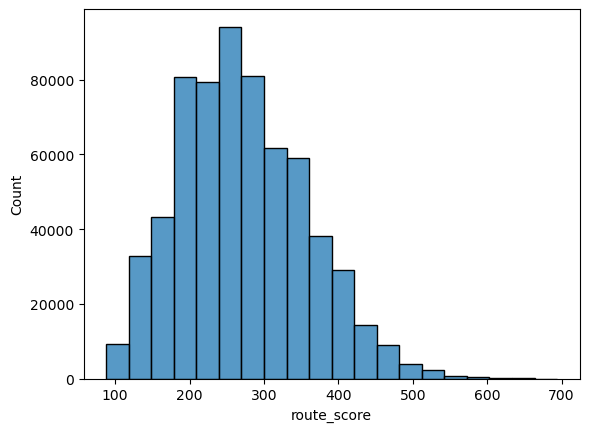

In [280]:
sns.histplot(possible_routes['route_score'], bins=20)

In [175]:
for col in route_columns[1:-1]:
    display(possible_routes.groupby(col, as_index=False).size().sort_values('size', ascending=False).head(10))


,Sunday,size
8,Le Mars,106170
1,Carter Lake,106066
4,Council Bluffs,98926
2,Cherokee,85456
7,Harlan,76406
5,Denison,63968
11,Sheldon,39735
6,Glenwood,36113
15,Storm Lake,32822
12,Shenandoah,20366


,Monday,size
3,Denison,132640
11,Storm Lake,119731
0,Atlantic,109275
5,Harlan,75810
7,Red Oak,53224
2,Clarinda,47700
9,Spencer,46717
10,Spirit Lake,44323
6,Milford,39557
8,Shenandoah,34419


,Tuesday,size
17,Winterset,97735
7,Fort Dodge,97336
12,Perry,93718
10,Jefferson,88662
2,Carroll,75936
4,Creston,64108
1,Atlantic,62823
9,Humboldt,61870
5,Emmetsburg,28656
0,Algona,28656


,Wednesday,size
16,Huxley,44160
4,Bondurant,36708
30,Story City,36400
33,Webster City,33480
2,Ames,33384
3,Ankeny,32522
23,Nevada,32248
1,Altoona,31878
18,Iowa Falls,29854
11,Eagle Grove,27404


,Thursday,size
12,Tama,124488
6,Grinnell,115692
10,Oskaloosa,90160
1,Cedar Falls,81000
14,Waterloo,70770
4,Evansdale,55680
15,Waverly,37301
13,Vinton,33943
16,Williamsburg,33912
11,Ottumwa,28345


,Friday,size
9,North Liberty,61339
1,Coralville,60524
5,Iowa City,60524
13,Tiffin,60524
12,Solon,57715
0,Cedar Rapids,51706
3,Hiawatha,51706
7,Marion,51706
8,Mount Vernon,51706
11,Robins,51706


In [219]:
# display(possible_routes.groupby('Thursday', as_index=False).size())
# possible_routes.groupby('Friday', as_index=False).size()

In [112]:
# start_city = "Missouri Valley"

# t_start = time.time()
# these_routes = find_routes(G, route_columns[1:-1], start_city, constraint_sets=constraint_sets)
# elapsed = time.time() - t_start

# df_k = pd.DataFrame(these_routes, columns=route_columns[:-1])
# print(f"Found {len(these_routes)} route(s) in {elapsed/ 60:.2f} minutes.")

Found 1737 route(s) in 2.25 minutes.


In [116]:
# # FULL_DAYS = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'End']
# # FULL_DAYS = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
# FULL_DAYS = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday']
# # FULL_DAYS = ['Sunday', 'Monday', 'Tuesday', 'Wednesday',]
# # FULL_DAYS = ['Sunday', 'Monday']
# results_per_stage = {}

# # start_city = "Sioux Center"
# # start_city = "Onawa"
# start_city = "Missouri Valley"

# for k in range(1, len(FULL_DAYS) + 1):
#     subset_of_days = FULL_DAYS[:k]
    
#     # Find all routes with that many days
#     t_start = time.time()
#     these_routes = find_routes(G, subset_of_days, start_city)
#     t_end = time.time()
#     elapsed = t_end - t_start
    
#     # For convenience, also build a DataFrame
#     # If we have k days, then we have k+1 columns: [Starting City] + k "Day columns"
#     columns = ["Start"] + subset_of_days
#     df_k = pd.DataFrame(these_routes, columns=columns)
    
#     # Store the DataFrame and the count
#     results_per_stage[k] = {
#         "days": subset_of_days,
#         "num_routes": len(these_routes),
#         "df": df_k
#     }
    
#     print(f"{k} day(s): {subset_of_days} => Found {len(these_routes)} route(s) "
#             f"in {elapsed:.2f} seconds.")

In [ ]:
# 1 day(s): ['Sunday'] => Found 11 route(s) in 0.70 seconds.
# 2 day(s): ['Sunday', 'Monday'] => Found 31 route(s) in 1.06 seconds.
# 3 day(s): ['Sunday', 'Monday', 'Tuesday'] => Found 87 route(s) in 1.54 seconds.
# 4 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday'] => Found 2176 route(s) in 4.96 seconds.
# 5 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday'] => Found 33694 route(s) in 85.20 seconds.
# 6 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] => Found 257943 route(s) in 1512.70 seconds.

# # start_city = "Missouri Valley"
# 1 day(s): ['Sunday'] => Found 5 route(s) in 1.02 seconds.
# 2 day(s): ['Sunday', 'Monday'] => Found 11 route(s) in 6.58 seconds.
# 3 day(s): ['Sunday', 'Monday', 'Tuesday'] => Found 28 route(s) in 4.51 seconds.
# 4 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday'] => Found 348 route(s) in 107.73 seconds.
# 5 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday'] => Found 3024 route(s) in 877.40 seconds.
# 6 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] => Found 10729 route(s) in 88395.32 seconds.


# start_city = "Onawa"
# 1 day(s): ['Sunday'] => Found 5 route(s) in 0.89 seconds.
# 2 day(s): ['Sunday', 'Monday'] => Found 19 route(s) in 4.04 seconds.
# 3 day(s): ['Sunday', 'Monday', 'Tuesday'] => Found 46 route(s) in 7.70 seconds.
# 4 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday'] => Found 517 route(s) in 147.83 seconds.
# 5 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday'] => Found 4432 route(s) in 1277.21 seconds.
# 6 day(s): ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] => Found 15854 route(s) in 168786.67 seconds.

# Updated population and lon filtering
# 1 day(s): ['Sunday'] => Found 3 route(s) in 0.76 seconds.
# 2 day(s): ['Sunday', 'Monday'] => Found 6 route(s) in 1.18 seconds.
# 3 day(s): ['Sunday', 'Monday', 'Tuesday'] => Found 16 route(s) in 3.56 seconds.

# 1 day(s): ['Sunday'] => Found 11 route(s) in 1.55 seconds.
# 2 day(s): ['Sunday', 'Monday'] => Found 89 route(s) in 7.17 seconds.

# # 10 minutes -> 8 -> 7
# 1 day(s): ['Sunday'] => Found 11 route(s)
# 2 day(s): ['Sunday', 'Monday'] => Found 123 route(s)
# 3 day(s): ['Sunday', 'Monday', 'Tuesday'] => Found 1590 route(s)

# # 1 day(s): ['Sunday'] => Found 11 route(s)
# 2 day(s): ['Sunday', 'Monday'] => Found 148 route(s)
# 3 day(s): ['Sunday', 'Monday', 'Tuesday'] => Found 2041 route(s)

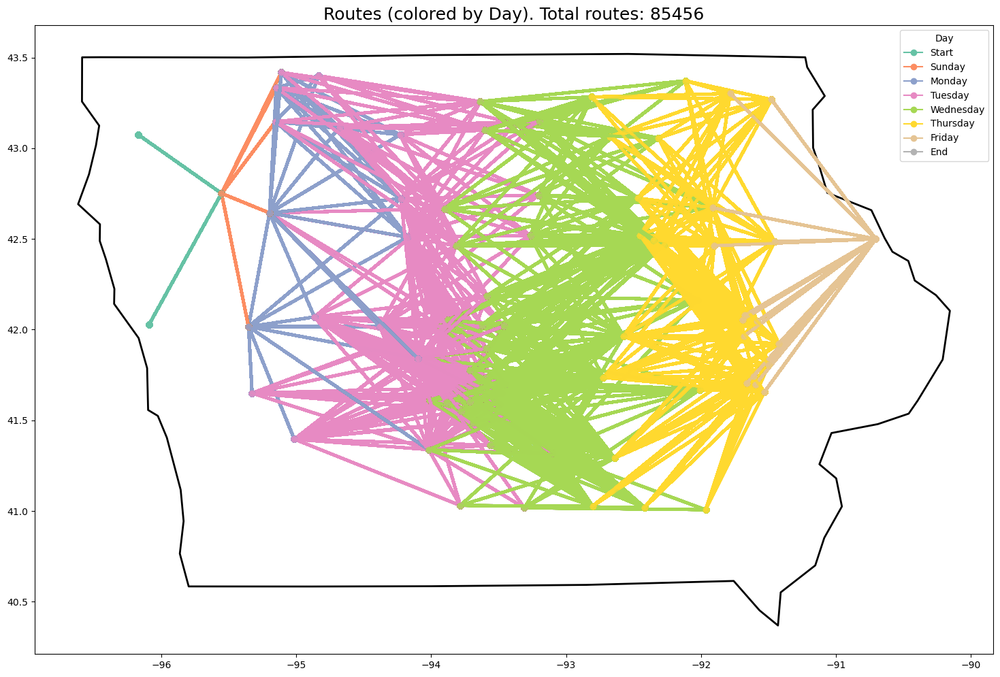

In [221]:
# semi_final_routes = merged_routes.copy()
def plot_routes(semi_final_routes, max_routes=None): 
    # Tag each route with a unique ID
    semi_final_routes['Route_ID'] = np.arange(len(semi_final_routes))

    # Melt
    final_routes_long = pd.melt(
        semi_final_routes,
        id_vars=['Route_ID'],
        value_vars=semi_final_routes.columns.drop('Route_ID').tolist(),
        var_name='Day',
        value_name='Town'
    ).dropna(subset=['Town'])

    final_merged_df = pd.merge(
        final_routes_long,
        towns[['name', 'lon', 'lat']],
        left_on='Town',
        right_on='name',
        how='left'
    ).dropna(subset=['lon', 'lat'])

    final_merged_df['Day'] = pd.Categorical(final_merged_df['Day'], categories=route_columns, ordered=True)
    final_merged_df = final_merged_df.sort_values(['Route_ID', 'Day'])


    fig, ax = plt.subplots(figsize=(20, 12))
    iowa_map.plot(ax=ax, color='none', edgecolor='black', linewidth=2)

    unique_routes = final_merged_df['Route_ID'].unique()
    if max_routes:
        unique_routes = np.random.choice(unique_routes, size=max_routes, replace=False)

    for ride in unique_routes:
        route_data = final_merged_df[final_merged_df['Route_ID'] == ride].copy()
        # route_data is sorted by Day already (thanks to your sorting),
        # but let's confirm:
        route_data = route_data.sort_values('Day')
        
        # We can walk through rows in pairs
        # e.g. row i: (Day_i, lon_i, lat_i), row i+1: (Day_(i+1), lon_(i+1), lat_(i+1))
        # We'll color each segment by Day_i
        for i in range(len(route_data) - 1):
            row_i = route_data.iloc[i]
            row_next = route_data.iloc[i+1]
            
            day_i = row_i['Day']
            x0, y0 = row_i['lon'], row_i['lat']
            x1, y1 = row_next['lon'], row_next['lat']
            
            color = day_colors.get(day_i, 'black')  # fallback color = black
            ax.plot([x0, x1], [y0, y1], marker='o', color=color, alpha=0.7, linewidth=3)

    plt.title(f"Routes (colored by Day). Total routes: {len(unique_routes)}", fontsize=18)

    # If you want a legend for days, you can do something like:
    import matplotlib.lines as mlines
    legend_handles = [mlines.Line2D([], [], color=c, marker='o', label=d) 
                    for d, c in day_colors.items()]
    ax.legend(handles=legend_handles, title="Day")

    plt.show()

plot_routes(possible_routes[possible_routes.Sunday == 'Cherokee'].copy())

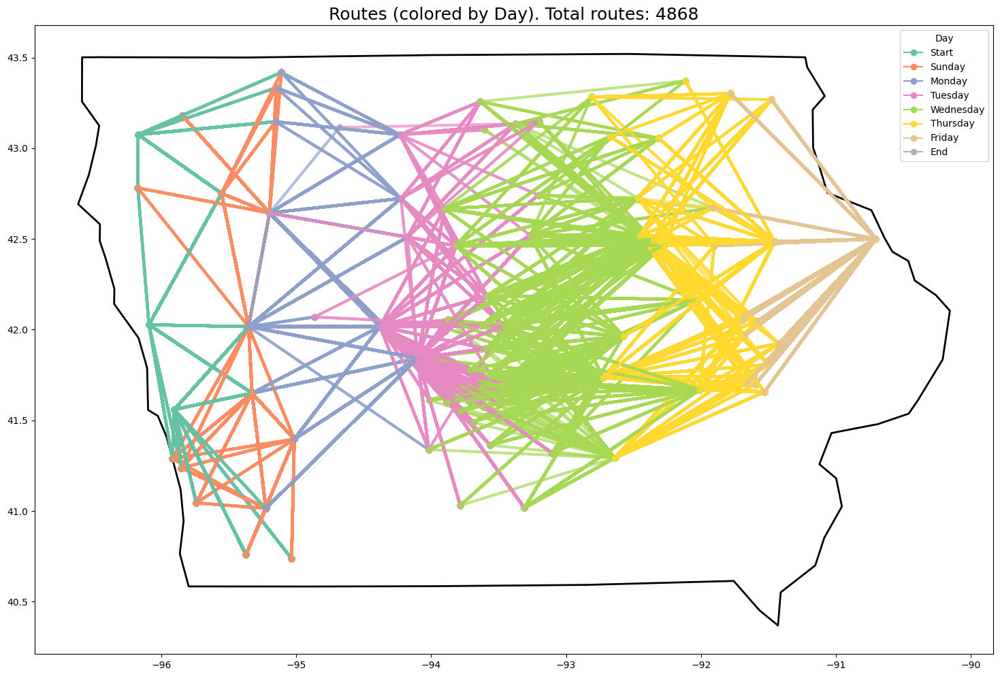

In [237]:
plot_routes(possible_routes[possible_routes.route_score > 500].copy())

In [281]:
possible_routes.sort_values(by='route_score', ascending=False).iloc[:30]

,Start,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,End,route_score
23526,Hawarden,Cherokee,Storm Lake,Perry,Nevada,Cedar Falls,Manchester,Dubuque,694
23597,Hawarden,Cherokee,Storm Lake,Perry,Nevada,Waterloo,Manchester,Dubuque,693
24009,Hawarden,Cherokee,Storm Lake,Perry,Webster City,Cedar Falls,Manchester,Dubuque,690
24064,Hawarden,Cherokee,Storm Lake,Perry,Webster City,Waterloo,Manchester,Dubuque,689
23552,Hawarden,Cherokee,Storm Lake,Perry,Nevada,Grinnell,Manchester,Dubuque,688
24040,Hawarden,Cherokee,Storm Lake,Perry,Webster City,Grinnell,Manchester,Dubuque,684
23024,Hawarden,Cherokee,Storm Lake,Perry,Chariton,Grinnell,Manchester,Dubuque,682
23839,Hawarden,Cherokee,Storm Lake,Perry,Story City,Cedar Falls,Manchester,Dubuque,681
23910,Hawarden,Cherokee,Storm Lake,Perry,Story City,Waterloo,Manchester,Dubuque,680
23865,Hawarden,Cherokee,Storm Lake,Perry,Story City,Grinnell,Manchester,Dubuque,675


In [251]:
possible_routes.sort_values(by='route_score', ascending=False).iloc[:30]

,Start,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,End,route_score
206586,Missouri Valley,Harlan,Denison,Perry,Nevada,Cedar Falls,Manchester,Dubuque,661
206664,Missouri Valley,Harlan,Denison,Perry,Nevada,Waterloo,Manchester,Dubuque,660
207138,Missouri Valley,Harlan,Denison,Perry,Webster City,Cedar Falls,Manchester,Dubuque,657
207202,Missouri Valley,Harlan,Denison,Perry,Webster City,Waterloo,Manchester,Dubuque,656
41482,Sioux Center,Cherokee,Storm Lake,Perry,Nevada,Cedar Falls,Manchester,Dubuque,655
206615,Missouri Valley,Harlan,Denison,Perry,Nevada,Grinnell,Manchester,Dubuque,655
41560,Sioux Center,Cherokee,Storm Lake,Perry,Nevada,Waterloo,Manchester,Dubuque,654
42034,Sioux Center,Cherokee,Storm Lake,Perry,Webster City,Cedar Falls,Manchester,Dubuque,651
207172,Missouri Valley,Harlan,Denison,Perry,Webster City,Grinnell,Manchester,Dubuque,651
42098,Sioux Center,Cherokee,Storm Lake,Perry,Webster City,Waterloo,Manchester,Dubuque,650


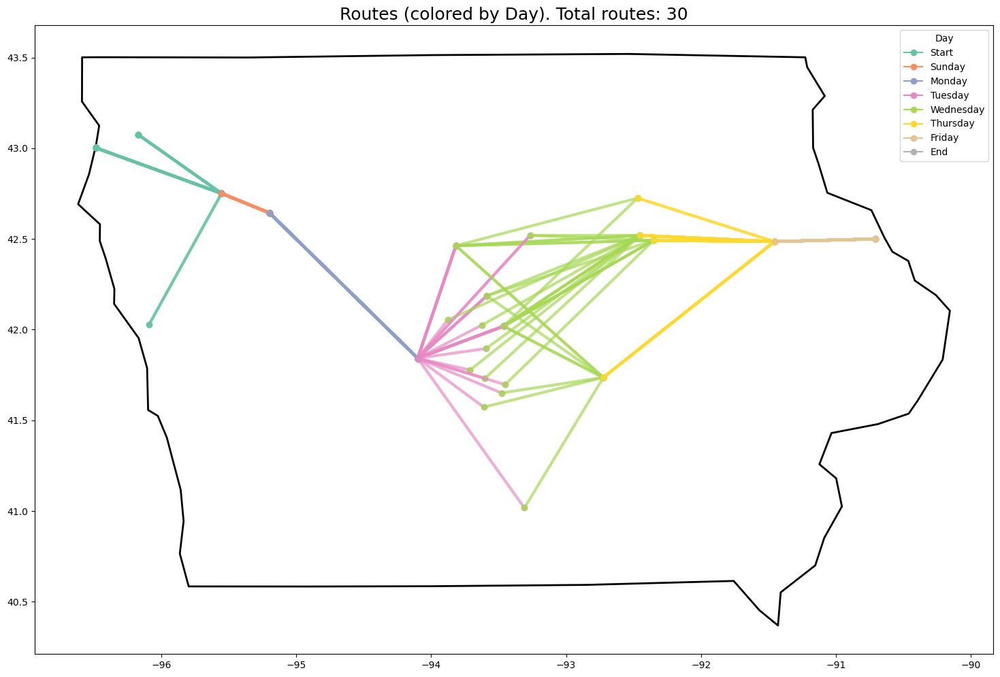

In [282]:
plot_routes(possible_routes.sort_values(by='route_score', ascending=False).iloc[:30].copy())

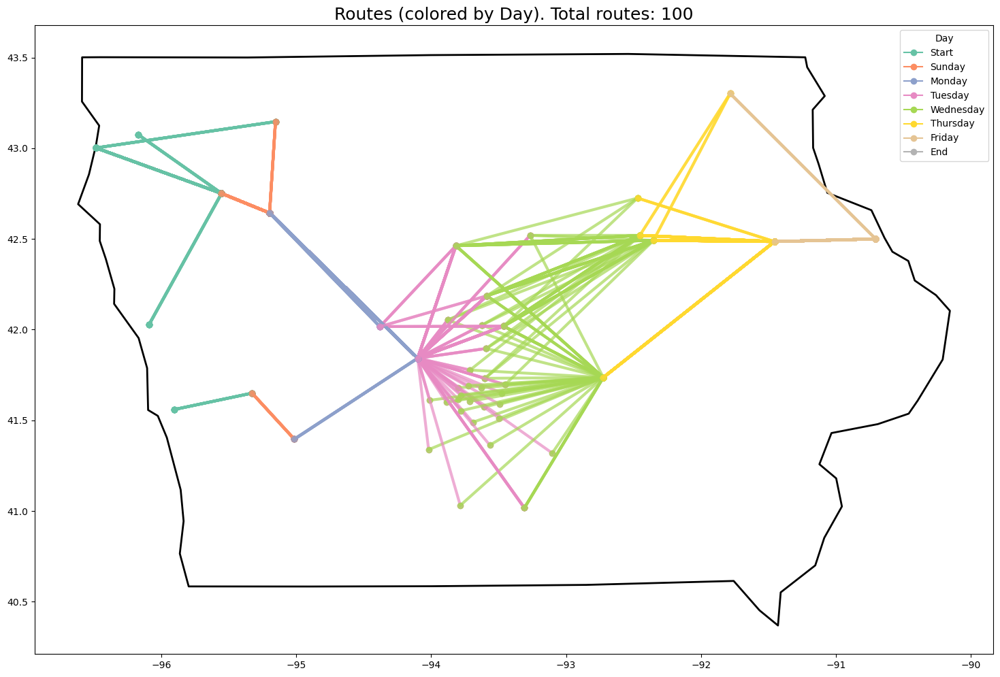

In [283]:
plot_routes(possible_routes.sort_values(by='route_score', ascending=False).iloc[:100].copy())

In [228]:
mask = (possible_routes.Sunday == 'Cherokee') & \
        (possible_routes.Monday == 'Algona') & \
        (possible_routes.Tuesday == 'Clear Lake') & \
        (possible_routes.Wednesday == 'Charles City')

possible_routes[mask]

,Start,Sunday,Monday,Tuesday,Wednesday,Thursday,Friday,End


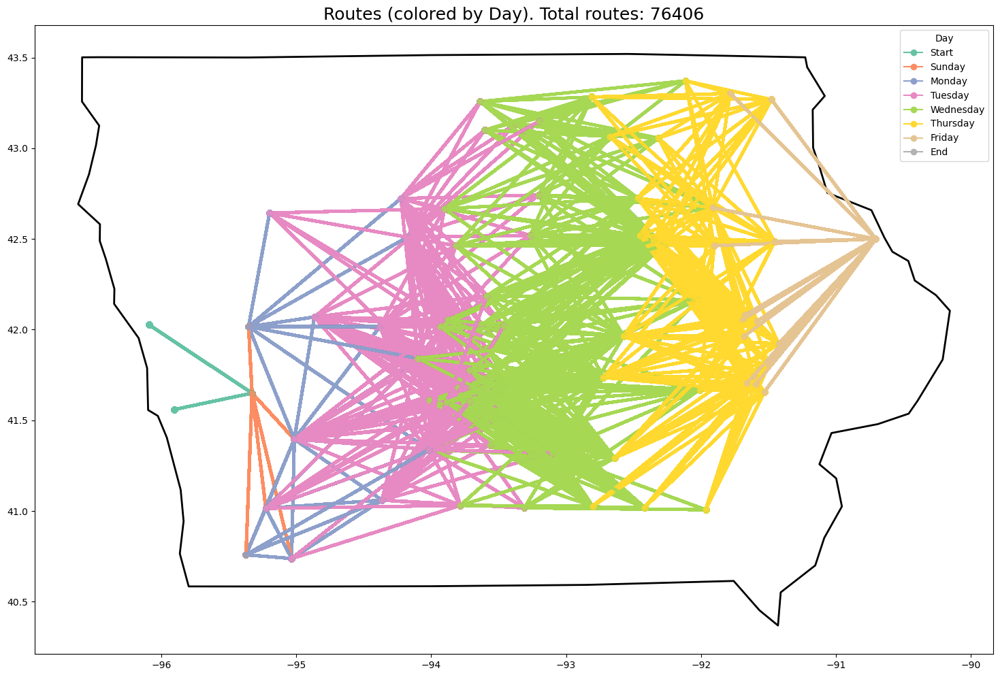

In [222]:
plot_routes(possible_routes[possible_routes.Sunday == 'Harlan'].copy())

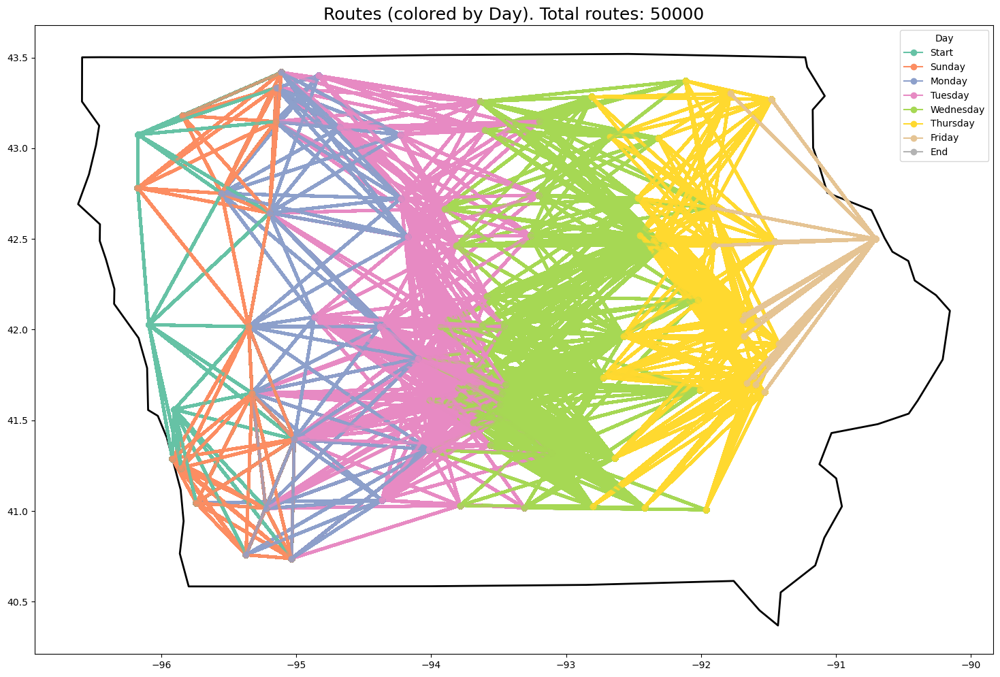

In [167]:
# semi_final_routes = merged_routes.copy()
semi_final_routes = possible_routes.copy()
# semi_final_routes = df_k.copy()

# Tag each route with a unique ID
semi_final_routes['Route_ID'] = np.arange(len(semi_final_routes))

# Melt
final_routes_long = pd.melt(
    semi_final_routes,
    id_vars=['Route_ID'],
    value_vars=semi_final_routes.columns.drop('Route_ID').tolist(),
    var_name='Day',
    value_name='Town'
).dropna(subset=['Town'])

final_merged_df = pd.merge(
    final_routes_long,
    towns[['name', 'lon', 'lat']],
    left_on='Town',
    right_on='name',
    how='left'
).dropna(subset=['lon', 'lat'])

final_merged_df['Day'] = pd.Categorical(final_merged_df['Day'], categories=route_columns, ordered=True)
final_merged_df = final_merged_df.sort_values(['Route_ID', 'Day'])


fig, ax = plt.subplots(figsize=(20, 12))
iowa_map.plot(ax=ax, color='none', edgecolor='black', linewidth=2)

unique_routes = final_merged_df['Route_ID'].unique()
# Potentially sample if it's huge
unique_routes = np.random.choice(unique_routes, size=50000, replace=False)

for ride in unique_routes:
    route_data = final_merged_df[final_merged_df['Route_ID'] == ride].copy()
    # route_data is sorted by Day already (thanks to your sorting),
    # but let's confirm:
    route_data = route_data.sort_values('Day')
    
    # We can walk through rows in pairs
    # e.g. row i: (Day_i, lon_i, lat_i), row i+1: (Day_(i+1), lon_(i+1), lat_(i+1))
    # We'll color each segment by Day_i
    for i in range(len(route_data) - 1):
        row_i = route_data.iloc[i]
        row_next = route_data.iloc[i+1]
        
        day_i = row_i['Day']
        x0, y0 = row_i['lon'], row_i['lat']
        x1, y1 = row_next['lon'], row_next['lat']
        
        color = day_colors.get(day_i, 'black')  # fallback color = black
        ax.plot([x0, x1], [y0, y1], marker='o', color=color, alpha=0.7, linewidth=3)

plt.title(f"Routes (colored by Day). Total routes: {len(unique_routes)}", fontsize=18)

# If you want a legend for days, you can do something like:
import matplotlib.lines as mlines
legend_handles = [mlines.Line2D([], [], color=c, marker='o', label=d) 
                  for d, c in day_colors.items()]
ax.legend(handles=legend_handles, title="Day")

plt.show()

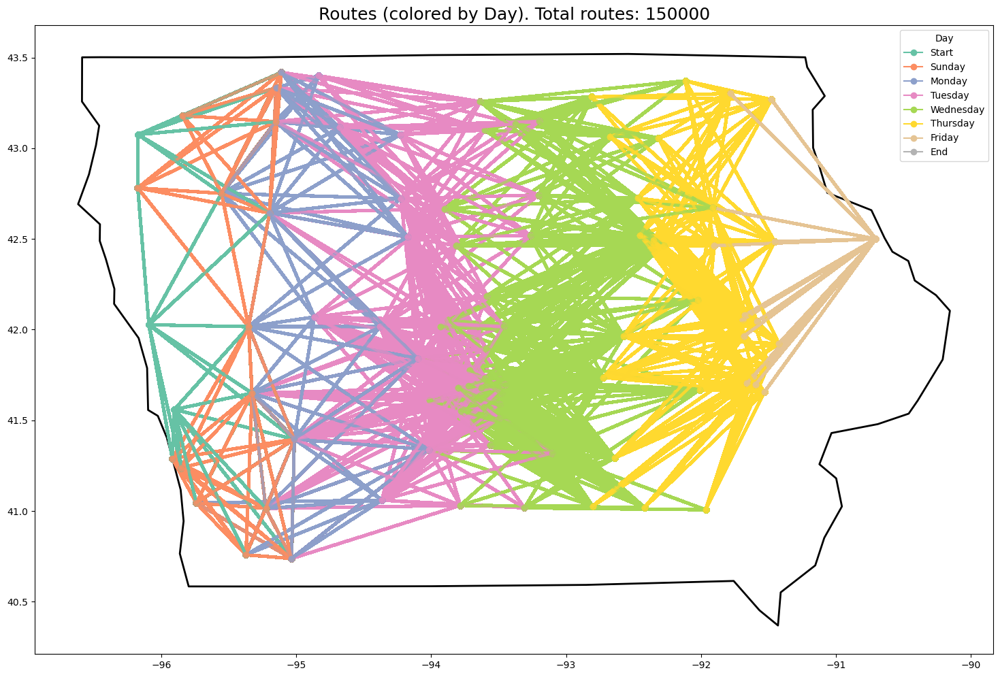

In [168]:
# semi_final_routes = merged_routes.copy()
semi_final_routes = possible_routes.copy()
# semi_final_routes = df_k.copy()

# Tag each route with a unique ID
semi_final_routes['Route_ID'] = np.arange(len(semi_final_routes))

# Melt
final_routes_long = pd.melt(
    semi_final_routes,
    id_vars=['Route_ID'],
    value_vars=semi_final_routes.columns.drop('Route_ID').tolist(),
    var_name='Day',
    value_name='Town'
).dropna(subset=['Town'])

final_merged_df = pd.merge(
    final_routes_long,
    towns[['name', 'lon', 'lat']],
    left_on='Town',
    right_on='name',
    how='left'
).dropna(subset=['lon', 'lat'])

final_merged_df['Day'] = pd.Categorical(final_merged_df['Day'], categories=route_columns, ordered=True)
final_merged_df = final_merged_df.sort_values(['Route_ID', 'Day'])


fig, ax = plt.subplots(figsize=(20, 12))
iowa_map.plot(ax=ax, color='none', edgecolor='black', linewidth=2)

unique_routes = final_merged_df['Route_ID'].unique()
# Potentially sample if it's huge
unique_routes = np.random.choice(unique_routes, size=150000, replace=False)

for ride in unique_routes:
    route_data = final_merged_df[final_merged_df['Route_ID'] == ride].copy()
    # route_data is sorted by Day already (thanks to your sorting),
    # but let's confirm:
    route_data = route_data.sort_values('Day')
    
    # We can walk through rows in pairs
    # e.g. row i: (Day_i, lon_i, lat_i), row i+1: (Day_(i+1), lon_(i+1), lat_(i+1))
    # We'll color each segment by Day_i
    for i in range(len(route_data) - 1):
        row_i = route_data.iloc[i]
        row_next = route_data.iloc[i+1]
        
        day_i = row_i['Day']
        x0, y0 = row_i['lon'], row_i['lat']
        x1, y1 = row_next['lon'], row_next['lat']
        
        color = day_colors.get(day_i, 'black')  # fallback color = black
        ax.plot([x0, x1], [y0, y1], marker='o', color=color, alpha=0.7, linewidth=3)

plt.title(f"Routes (colored by Day). Total routes: {len(unique_routes)}", fontsize=18)

# If you want a legend for days, you can do something like:
import matplotlib.lines as mlines
legend_handles = [mlines.Line2D([], [], color=c, marker='o', label=d) 
                  for d, c in day_colors.items()]
ax.legend(handles=legend_handles, title="Day")

plt.show()

### Filter routes that are viable to Dubuque

In [561]:
final_routes = merged_routes.copy()

end_city = 'Dubuque'
final_routes['End'] = end_city
final_routes['End_distance'] = 0 # Placeholder
cand_node = get_city_node(city=end_city)

for city in df_k['Friday'].unique():
    current_node = get_city_node(city)
    dist = compute_distance(G, current_node, cand_node)
    final_routes.loc[final_routes.Friday == city, "End_distance"] = dist

dist_mask = (final_routes["End_distance"] >= MIN_DAILY_DIST) & (final_routes["End_distance"] <= MAX_DAILY_DIST)
final_routes = final_routes[dist_mask].copy()

In [562]:
df_k.Thursday.unique()

array(['Altoona', 'Ankeny', 'Bondurant', 'Carlisle', 'Chariton', 'Huxley',
       'Indianola', 'Knoxville', 'Nevada', 'Newton', 'Pella',
       'Pleasant Hill', 'Story City', 'Albia', 'Grinnell', 'Oskaloosa',
       'Centerville', 'Marshalltown', 'Des Moines', 'Hampton',
       'Iowa Falls', 'Tama', 'Garner', 'Clear Lake', 'Mason City',
       'Charles City', 'Osage', 'Waverly'], dtype=object)

In [563]:
final_routes.Thursday.unique()

array(['Iowa Falls', 'Tama', 'Charles City', 'Waverly'], dtype=object)

In [564]:
df_k.Friday.unique()

array(['Grinnell', 'Oskaloosa', 'Tama', 'Ottumwa', 'Williamsburg',
       'Fairfield', 'Evansdale', 'Vinton', 'Washington', 'Cedar Falls',
       'Hiawatha', 'Waterloo', 'Waverly', 'Charles City', 'New Hampton',
       'Independence', 'Cresco', 'Decorah', 'Oelwein'], dtype=object)

In [565]:
final_routes.Friday.unique()

array(['Independence', 'Oelwein'], dtype=object)

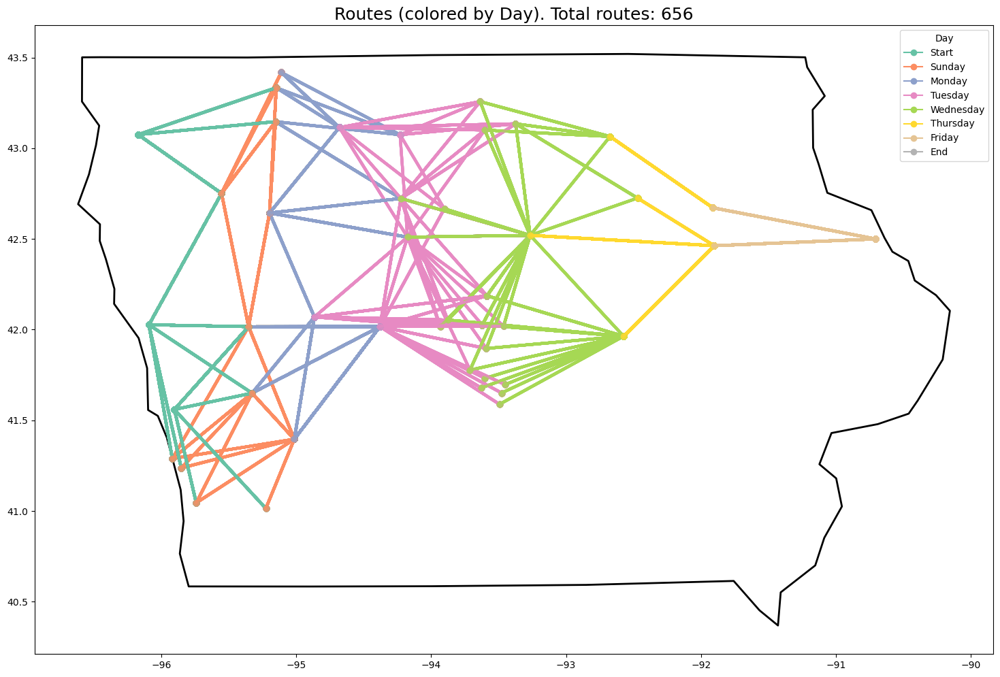

In [566]:
# Tag each route with a unique ID
final_routes['Route_ID'] = np.arange(len(final_routes))

# Melt
final_routes_long = pd.melt(
    final_routes,
    id_vars=['Route_ID'],
    value_vars=final_routes.columns.drop('Route_ID').tolist(),
    var_name='Day',
    value_name='Town'
).dropna(subset=['Town'])

final_merged_df = pd.merge(
    final_routes_long,
    towns[['name', 'lon', 'lat']],
    left_on='Town',
    right_on='name',
    how='left'
).dropna(subset=['lon', 'lat'])

final_merged_df['Day'] = pd.Categorical(final_merged_df['Day'], categories=route_columns, ordered=True)
final_merged_df = final_merged_df.sort_values(['Route_ID', 'Day'])


fig, ax = plt.subplots(figsize=(20, 12))
iowa_map.plot(ax=ax, color='none', edgecolor='black', linewidth=2)

unique_routes = final_merged_df['Route_ID'].unique()
# Potentially sample if it's huge
# unique_routes = np.random.choice(unique_routes, size=500, replace=False)

for ride in unique_routes:
    route_data = final_merged_df[final_merged_df['Route_ID'] == ride].copy()
    # route_data is sorted by Day already (thanks to your sorting),
    # but let's confirm:
    route_data = route_data.sort_values('Day')
    
    # We can walk through rows in pairs
    # e.g. row i: (Day_i, lon_i, lat_i), row i+1: (Day_(i+1), lon_(i+1), lat_(i+1))
    # We'll color each segment by Day_i
    for i in range(len(route_data) - 1):
        row_i = route_data.iloc[i]
        row_next = route_data.iloc[i+1]
        
        day_i = row_i['Day']
        x0, y0 = row_i['lon'], row_i['lat']
        x1, y1 = row_next['lon'], row_next['lat']
        
        color = day_colors.get(day_i, 'black')  # fallback color = black
        ax.plot([x0, x1], [y0, y1], marker='o', color=color, alpha=0.7, linewidth=3)

plt.title(f"Routes (colored by Day). Total routes: {len(unique_routes)}", fontsize=18)

# If you want a legend for days, you can do something like:
import matplotlib.lines as mlines
legend_handles = [mlines.Line2D([], [], color=c, marker='o', label=d) 
                  for d, c in day_colors.items()]
ax.legend(handles=legend_handles, title="Day")

plt.show()

In [568]:
final_routes.Thursday.value_counts()

Thursday
Iowa Falls      327
Tama            231
Charles City     68
Waverly          30
Name: count, dtype: int64

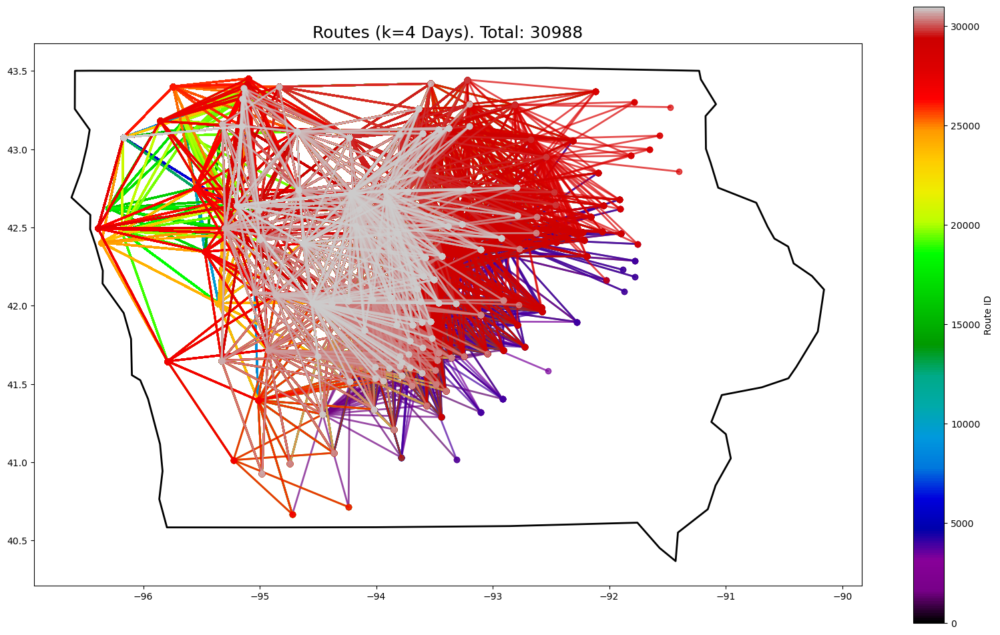

In [323]:
# Tag each route with a unique ID
df_k['Route_ID'] = np.arange(len(df_k))
town_columns = df_k.columns.drop('Route_ID').tolist()  # all day-town columns

# Melt
routes_long = pd.melt(
    df_k,
    id_vars=['Route_ID'],
    value_vars=town_columns,
    var_name='Day',
    value_name='Town'
).dropna(subset=['Town'])

merged_df = pd.merge(
    routes_long,
    towns[['name', 'lon', 'lat']],
    left_on='Town',
    right_on='name',
    how='left'
).dropna(subset=['lon', 'lat'])

merged_df['Day'] = pd.Categorical(merged_df['Day'], categories=route_columns, ordered=True)
merged_df = merged_df.sort_values(['Route_ID', 'Day'])

# Plot
fig, ax = plt.subplots(figsize=(20, 12))
iowa_map.plot(ax=ax, color='none', edgecolor='black', linewidth=2)

unique_routes = merged_df['Route_ID'].unique()
# If huge, sample:
# unique_routes = np.random.choice(unique_routes, size=50, replace=False)

norm = mcolors.Normalize(vmin=min(unique_routes), vmax=max(unique_routes))
cmap = cm.ScalarMappable(norm=norm, cmap='nipy_spectral')

for rid in unique_routes:
    data = merged_df[merged_df['Route_ID'] == rid]
    color = cmap.to_rgba(rid)
    ax.plot(data['lon'], data['lat'], marker='o', color=color, alpha=0.7, linewidth=2)

plt.title(f"Routes (k={len(town_columns)-1} Days). Total: {len(unique_routes)}", fontsize=18)
plt.colorbar(cm.ScalarMappable(norm=norm, cmap='nipy_spectral'), ax=ax, label='Route ID')
plt.show()

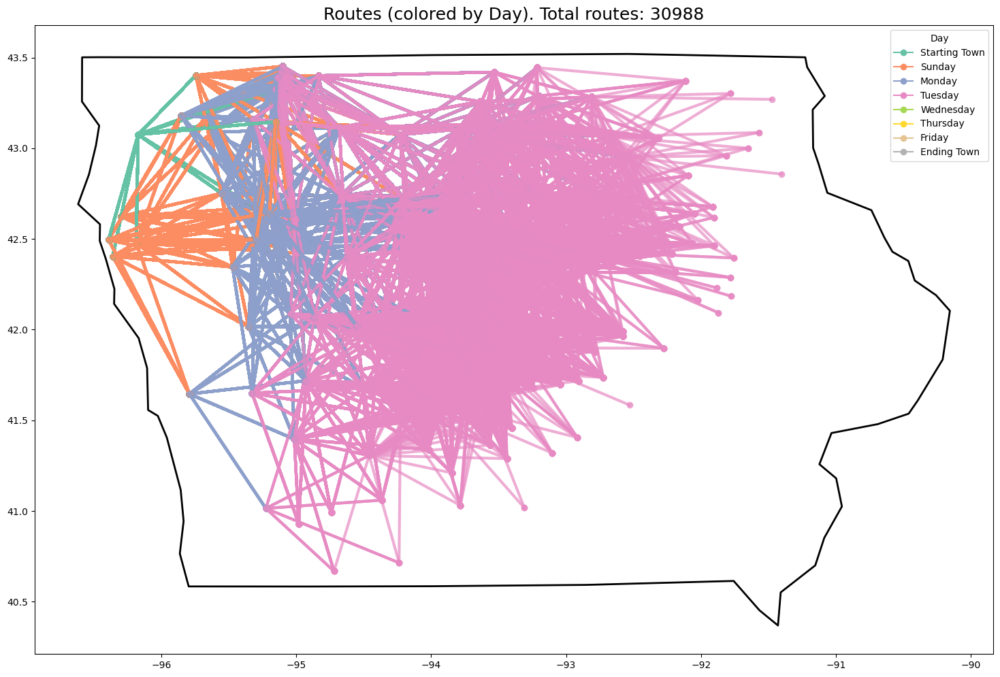

In [423]:


fig, ax = plt.subplots(figsize=(20, 12))
iowa_map.plot(ax=ax, color='none', edgecolor='black', linewidth=2)

unique_routes = merged_df['Route_ID'].unique()
# Potentially sample if it's huge
# unique_routes = np.random.choice(unique_routes, size=500, replace=False)

for rid in unique_routes:
    route_data = merged_df[merged_df['Route_ID'] == rid].copy()
    # route_data is sorted by Day already (thanks to your sorting),
    # but let's confirm:
    route_data = route_data.sort_values('Day')
    
    # We can walk through rows in pairs
    # e.g. row i: (Day_i, lon_i, lat_i), row i+1: (Day_(i+1), lon_(i+1), lat_(i+1))
    # We'll color each segment by Day_i
    for i in range(len(route_data) - 1):
        row_i = route_data.iloc[i]
        row_next = route_data.iloc[i+1]
        
        day_i = row_i['Day']
        x0, y0 = row_i['lon'], row_i['lat']
        x1, y1 = row_next['lon'], row_next['lat']
        
        color = day_colors.get(day_i, 'black')  # fallback color = black
        ax.plot([x0, x1], [y0, y1], marker='o', color=color, alpha=0.7, linewidth=3)

plt.title(f"Routes (colored by Day). Total routes: {len(unique_routes)}", fontsize=18)

# If you want a legend for days, you can do something like:
import matplotlib.lines as mlines
legend_handles = [mlines.Line2D([], [], color=c, marker='o', label=d) 
                  for d, c in day_colors.items()]
ax.legend(handles=legend_handles, title="Day")

plt.show()